In [1]:
import numpy as np
import matplotlib.pyplot as plt


In [25]:
baseline_scores = np.loadtxt('./result/baseline.txt')
baseline_scores = np.array([score for score in baseline_scores if score != 0]) #drop out values of 0 
mean_baseline = np.mean(baseline_scores)
std_baseline = np.std(baseline_scores)

print(f"Mean of baseline scores: {mean_baseline}")
print(f"Standard deviation of baseline scores: {std_baseline}")


Mean of baseline scores: 19.941811076965198
Standard deviation of baseline scores: 5.99804531019712


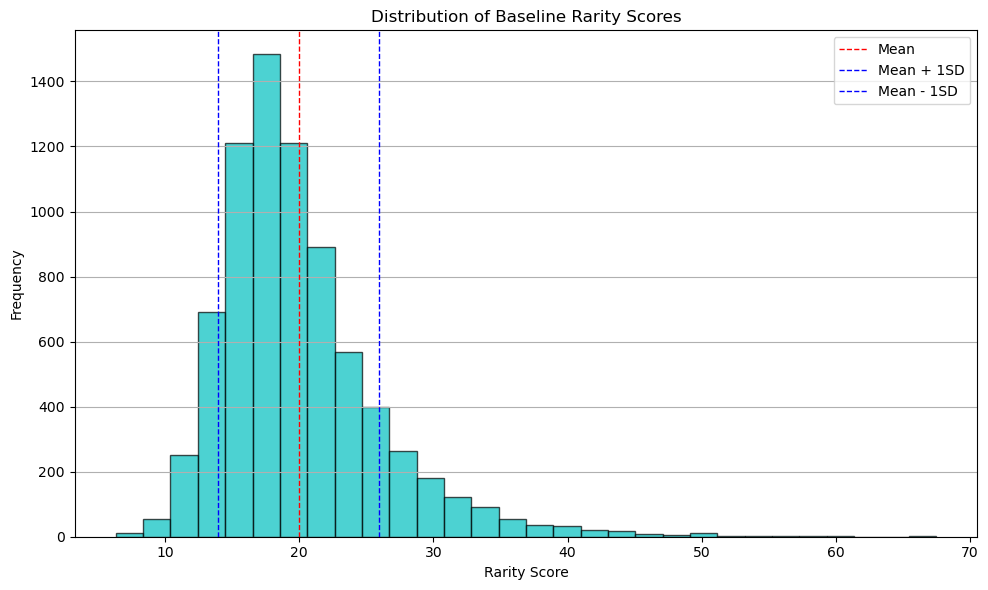

In [24]:
plt.figure(figsize=(10, 6))
plt.hist(baseline_scores, bins=30, color='c', edgecolor='black', alpha=0.7)
plt.axvline(mean_baseline, color='r', linestyle='dashed', linewidth=1, label='Mean')
plt.axvline(mean_baseline + std_baseline, color='b', linestyle='dashed', linewidth=1, label='Mean + 1SD')
plt.axvline(mean_baseline - std_baseline, color='b', linestyle='dashed', linewidth=1, label='Mean - 1SD')
plt.title('Distribution of Baseline Rarity Scores')
plt.xlabel('Rarity Score')
plt.ylabel('Frequency')
plt.legend(loc='upper right')
plt.grid(axis='y')
plt.tight_layout()
plt.show()


Files already downloaded and verified
Index 4104 with lowest score 6.322751925210661 
Index 831 with highest score 67.47475233511533 
Index 17 with most frequent score 15.359124294540576


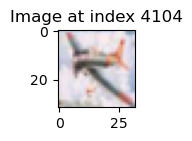

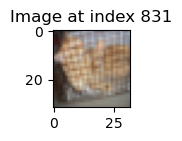

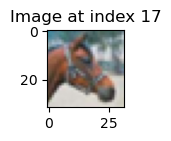

In [44]:
import torch
from torchvision import datasets, transforms, models
from PIL import Image

transform = transforms.Compose([
    transforms.ToTensor()
])
data_test = datasets.CIFAR10(
        root="./data/",
        transform = transform,
        train=False,
        download=True
)
data_loader_test = torch.utils.data.DataLoader(dataset=data_test, batch_size=64)

min_idx = np.argmin(baseline_scores)
max_idx = np.argmax(baseline_scores)
mode_idx = np.argmax(np.bincount(baseline_scores.astype(int)))
print(f"Index {min_idx} with lowest score {baseline_scores[min_idx]} ")
print(f"Index {max_idx} with highest score {baseline_scores[max_idx]} ")
print(f"Index {mode_idx} with most frequent score {baseline_scores[mode_idx]}")


def display_image(index, data_loader):
    for i, (imgs, _) in enumerate(data_loader):
        if index < (i+1)*64:
            plt.figure(figsize=(1,1))  #smaller figure size to make it look less blurry
            plt.imshow(np.transpose(imgs[index - i*64].numpy(), (1, 2, 0)))
            plt.title(f"Image at index {index}")
            plt.show()
            break



display_image(min_idx, data_loader_test)
display_image(max_idx, data_loader_test)
display_image(mode_idx, data_loader_test)


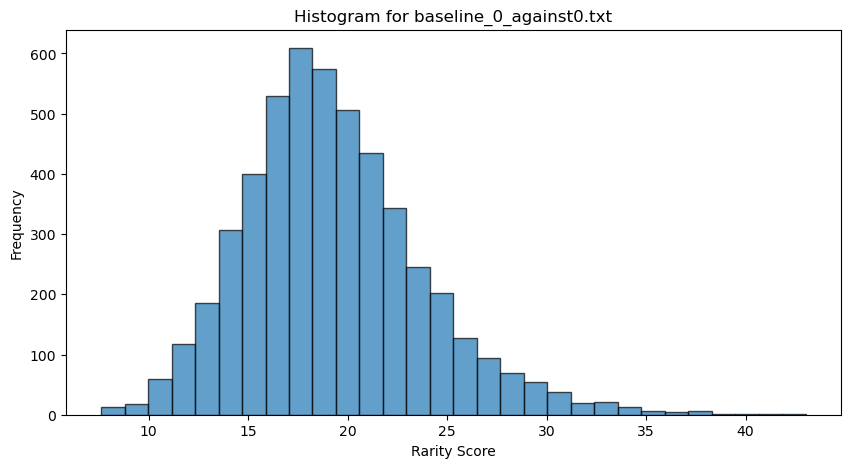

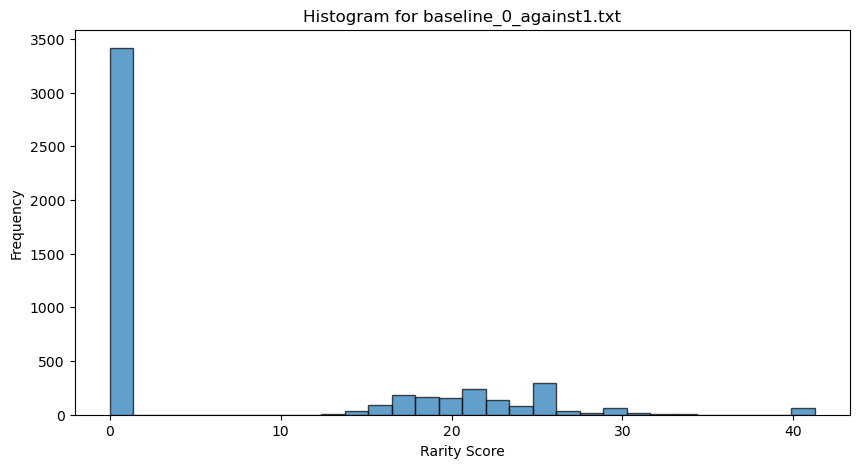

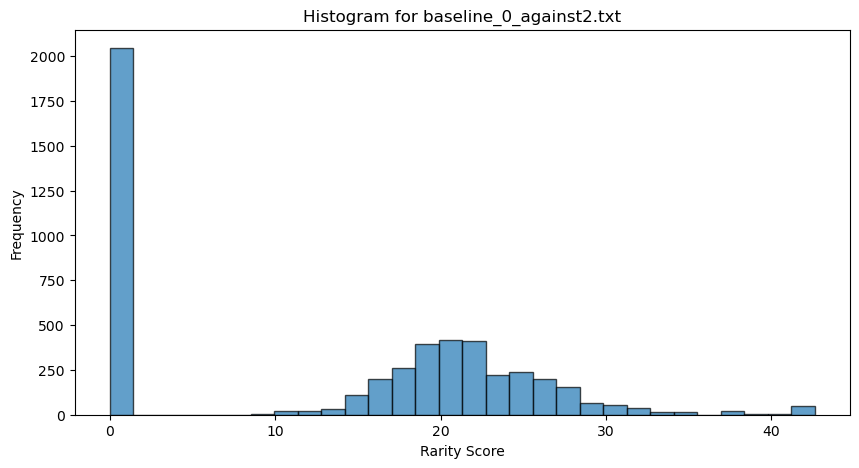

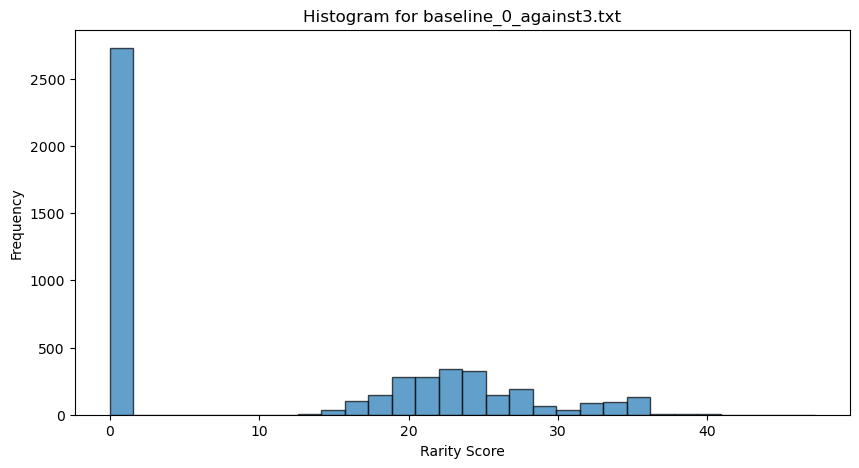

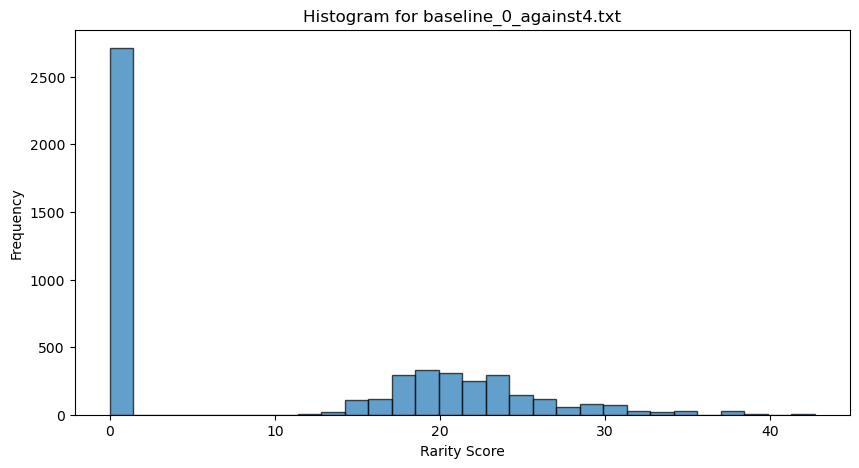

...

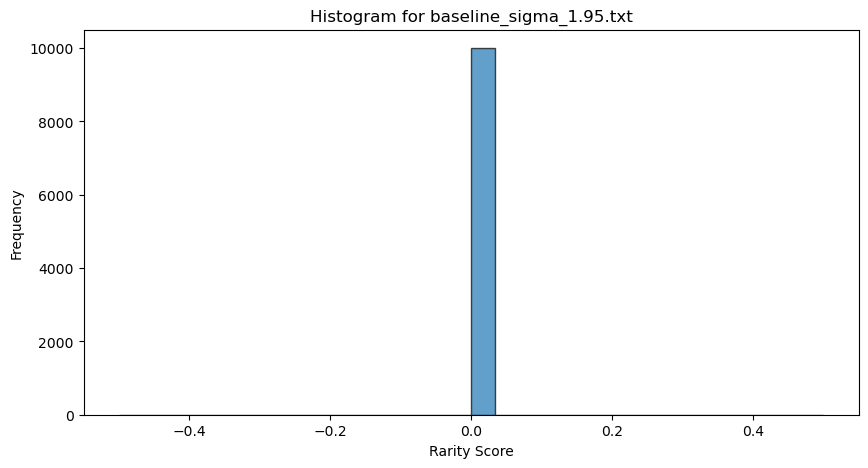

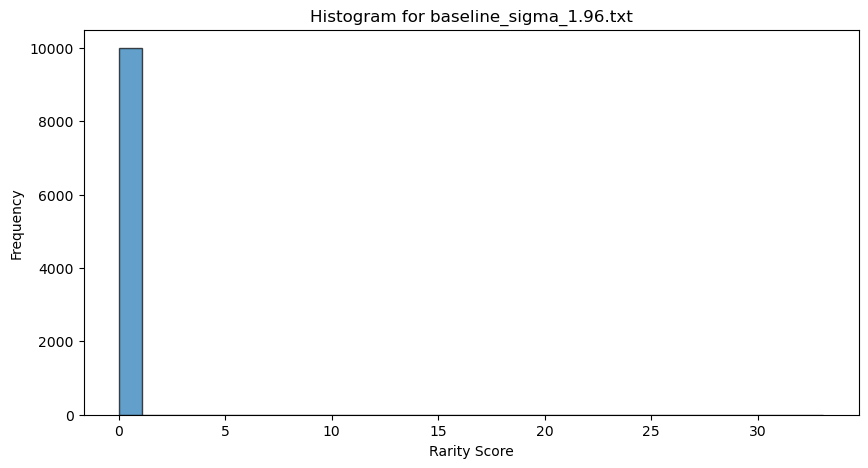

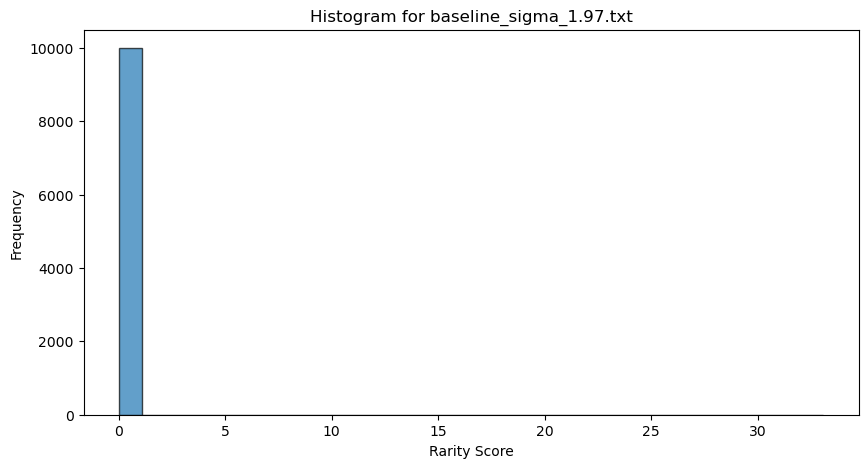

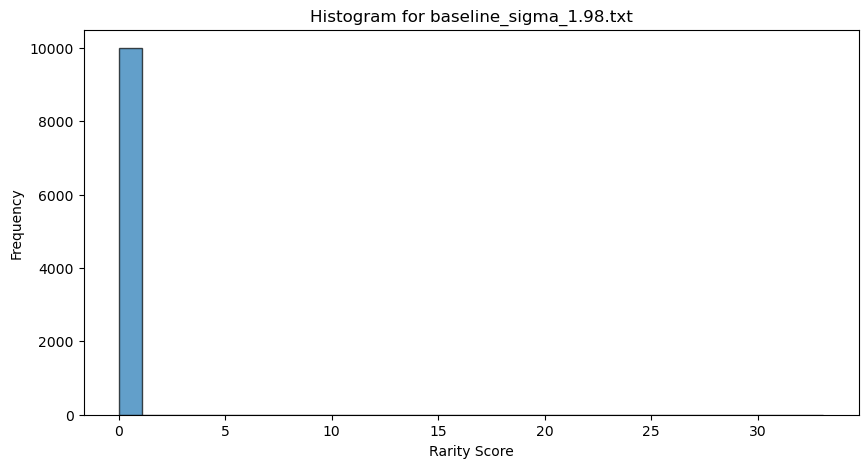

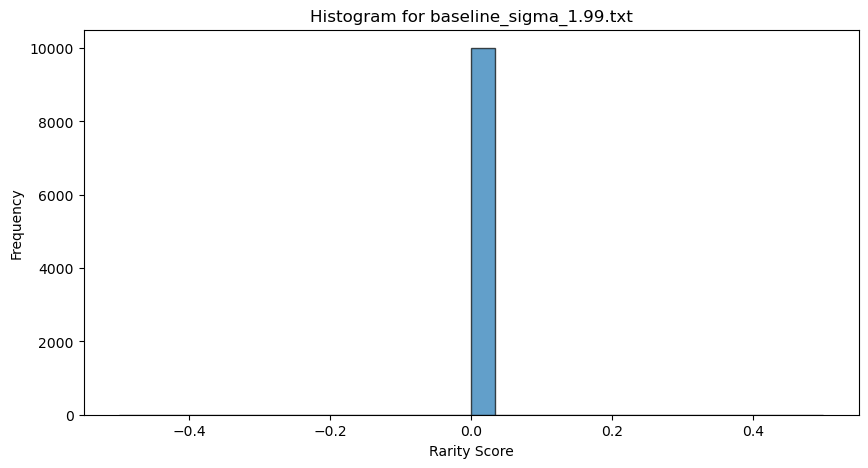

In [48]:
import numpy as np
import matplotlib.pyplot as plt
import os

directories = ['result/2_pairs_of_class/', 'result/9_class_against_remain/', 'result/add_gaussian_noise/',  'result/add_gaussian_noise_trial_2/']

for directory in directories:
    for filename in os.listdir(directory):
        if filename.endswith(".txt"):
            scores = np.loadtxt(os.path.join(directory, filename))
            # filtered_scores = scores[scores != 0]  # filter out zeros
            
            plt.figure(figsize=(10, 5))
            plt.hist(scores, bins=30, edgecolor='black', alpha=0.7)
            plt.title(f"Histogram for {filename}")
            plt.xlabel('Rarity Score')
            plt.ylabel('Frequency')
            plt.show()
